# Load dependencies
- Change oversample indices

In [1]:
#!python -m pip install -U SimpleITK
#!python -m pip install -U scikit-image

In [2]:
from __future__ import print_function

import SimpleITK as sitk
import sys
import os
import h5py
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
from sklearn.model_selection import train_test_split
from scipy import ndimage
#from medpy.filter import IntensityRangeStandardization
from skimage import exposure
from scipy import ndimage

from keras.utils import to_categorical

from functions.plot_slices import plot_slices

In [3]:
# Define the path + output path:
DIR = "/tf/notebooks/"
#OUTPUT_DIR = '/tf/notebooks/hezo/stroke_perfusion/callbacks/3D_CNN_ONTRAM_Zurich_mrs/'

# Import data

### Clinical and patient data

In [4]:
dat = pd.read_csv(DIR + "/hezo/stroke_perfusion/data/data_bern_25_11_2020_dwi.csv")

In [5]:
# Size of the dataframe: same as the images
dat.shape

(222, 69)

In [6]:
# define binary mRS
dat["mrs_3months_binary"] = 0
dat.loc[dat.mrs_3months <= 2, "mrs_3months_binary"] = 1

(array([32., 48., 39., 32., 32.,  5., 34.]),
 array([0.        , 0.85714286, 1.71428571, 2.57142857, 3.42857143,
        4.28571429, 5.14285714, 6.        ]),
 <BarContainer object of 7 artists>)

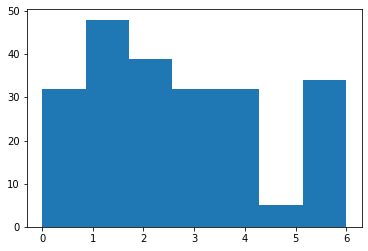

In [7]:
plt.hist(dat.mrs_3months, bins = 7)

(array([103., 119.]),
 array([0. , 0.5, 1. ]),
 <BarContainer object of 2 artists>)

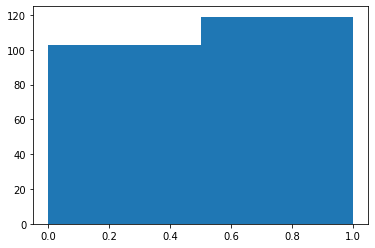

In [8]:
plt.hist(dat.mrs_3months_binary, bins = 2)

In [9]:
# simple imputation: replace all missing values with the mode of the column
for column in dat.columns:
    dat[column].fillna(dat[column].mode()[0], inplace=True)

In [10]:
dat.columns

Index(['p_id', 'columns', 'instance_no', 'path', 'rows', 'sequence',
       'modality', 'modality_no', 'folder', 'image', 'rank', 'age', 'sex',
       'independent_pre_stroke', 'nihss_bl', 'nihss_24h', 'nihss_diff_bl_24h',
       'nihss_3months', 'nihss_diff_bl_3months', 'mrs_3months',
       'death_after_3months', 'intracranial_bleeding', 'tah_pre_stroke',
       'antikoagulation_pre_stroke', 'statin_pre_stroke',
       'antihypertensiva_pre_stroke', 'sys_bloodpressure_bl',
       'dias_bloodpressure_bl', 'glucose_bl', 'hba1c', 'ldl', 'hdl',
       'triglyceride', 'crp', 'inr', 'anaesthesia', 'dense_media',
       'early_infarct_sign', 'atrial_fibrillation', 'rf_diabetes',
       'rf_hypertonia', 'rf_hypercholesterinaemie', 'rf_smoker', 'rf_chd',
       'rf_pavk', 'rf_tia_stroke', 'infarct_side', 'additional_occlusion',
       'additional_occlusion_side', 'additional_occlusion_ica_excranial',
       'additional_occlusion_ica_intracranial', 'additional_occlusion_ica_t',
       'additio

In [11]:
# tabular data for the prediction
# to make the values smaller we consider:
# a 10 unit change in age
# a 10 unit change in NIHSS
# a 20 unit change in BP
# a 120 (2h) change in time_to_imaging
X_tab = np.array([dat.age/10, dat.sex, dat.independent_pre_stroke, dat.nihss_bl/10, 
                  dat.sys_bloodpressure_bl/20, dat.time_to_imaging/120, dat.rf_hypertonia, dat.rf_smoker]).T
X_tab.shape

(222, 8)

In [12]:
Y = np.array(dat.mrs_3months_binary)
print(Y.shape)
Y = to_categorical(Y)
print(Y.shape)

(222,)
(222, 2)


### Import images

In [13]:
with h5py.File(DIR + "/hezo/stroke_perfusion/data/data_bern_25_11_2020.h5", "r") as h5:
    # Image matrix for tmax sequence
    X_dwi = h5["X_dwi"][:]
    X_adc = h5["X_adc"][:]
    X_cbv = h5["X_cbv"][:]
    X_cbf = h5["X_cbf"][:]
    X_mtt = h5["X_mtt"][:]
    X_ttp = h5["X_ttp"][:]
    X_tmax = h5["X_tmax"][:]

In [14]:
print(X_dwi.shape, X_adc.shape, X_cbv.shape, X_cbf.shape, X_mtt.shape, X_ttp.shape, X_tmax.shape)

(222, 128, 128, 64, 1) (222, 128, 128, 64, 1) (222, 128, 128, 64, 3) (222, 128, 128, 64, 3) (222, 128, 128, 64, 3) (222, 128, 128, 64, 3) (222, 128, 128, 64, 3)


In [15]:
print(X_dwi.min(), X_adc.min(), X_cbv.min(), X_cbf.min(), X_mtt.min(), X_ttp.min(), X_tmax.min())

0 0 0 0 0 0 0


In [16]:
print(X_dwi.max(), X_adc.max(), X_cbv.max(), X_cbf.max(), X_mtt.max(), X_ttp.max(), X_tmax.max())

1378 4095 255 255 255 249 255


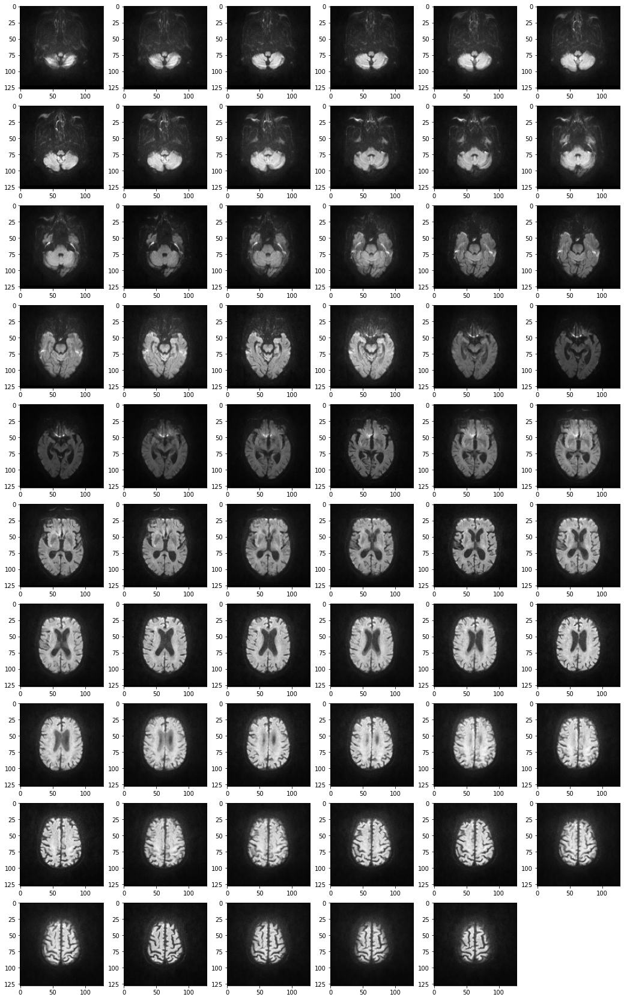

In [17]:
plot_slices(X_dwi[0], dat.loc[0,:], "axial", modality = "DWI")

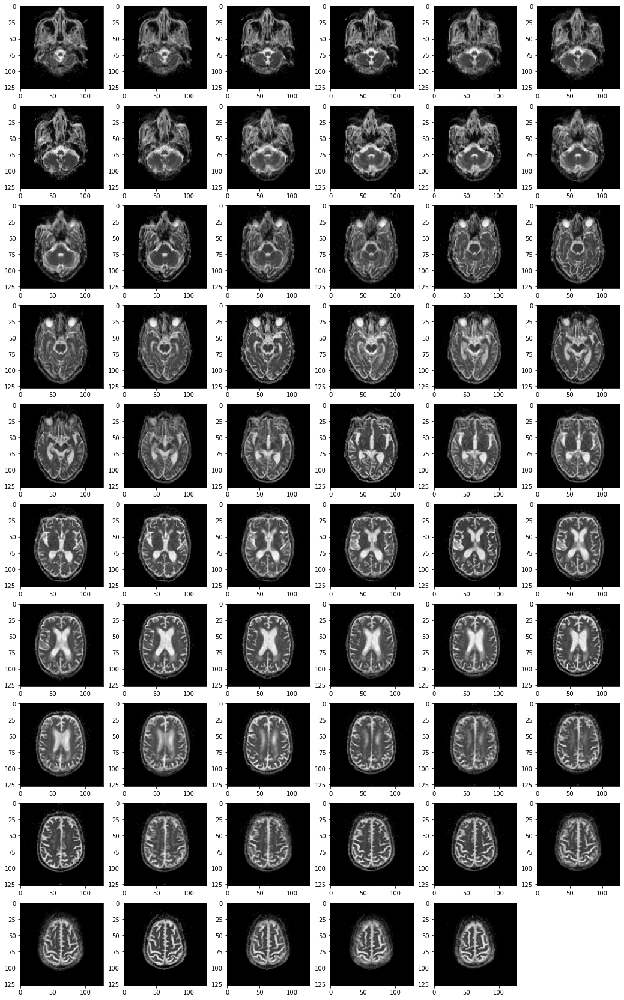

In [18]:
plot_slices(X_adc[0], dat.loc[0,:], "axial", modality = "DWI")

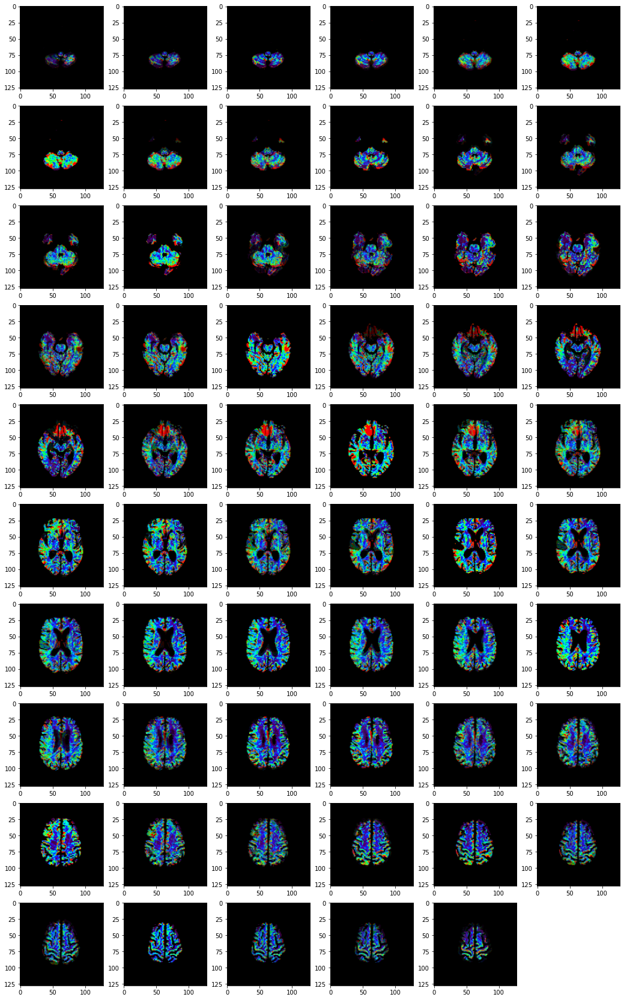

In [19]:
plot_slices(X_cbv[0], dat.loc[0,:], "axial")

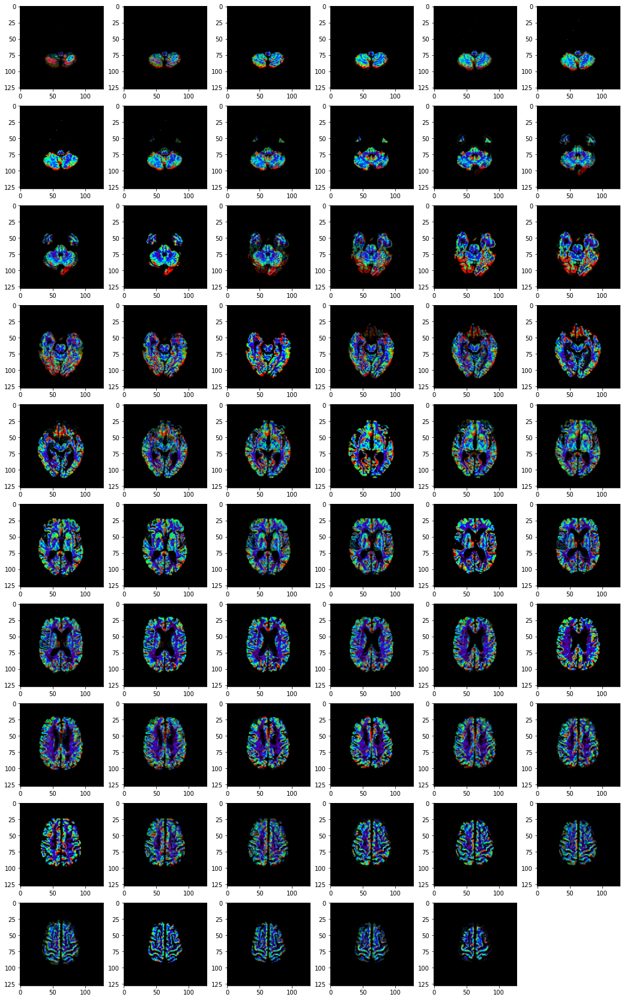

In [20]:
plot_slices(X_cbf[0], dat.loc[0,:], "axial")

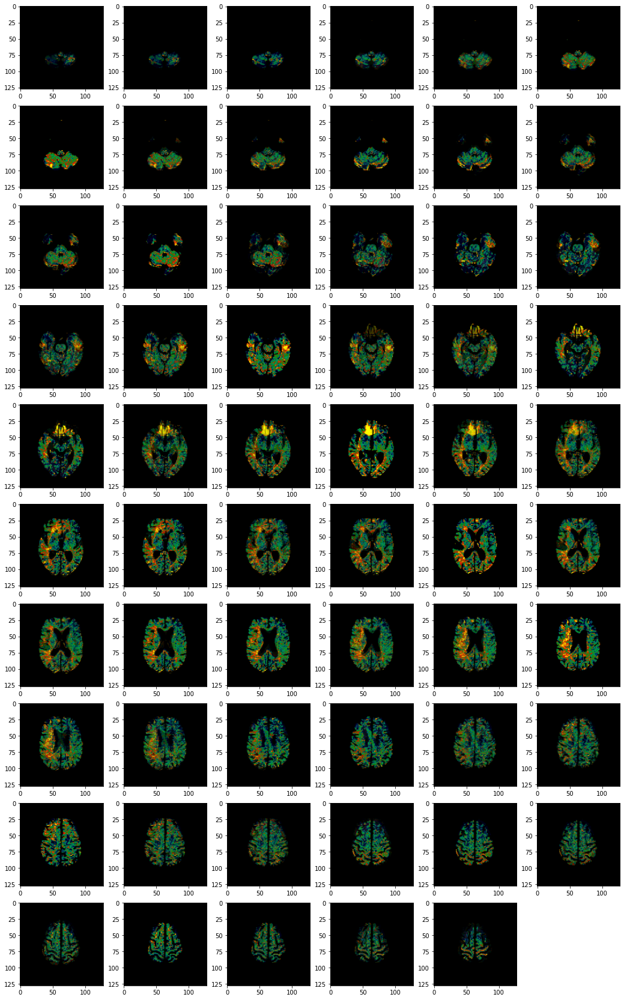

In [21]:
plot_slices(X_mtt[0], dat.loc[0,:], "axial")

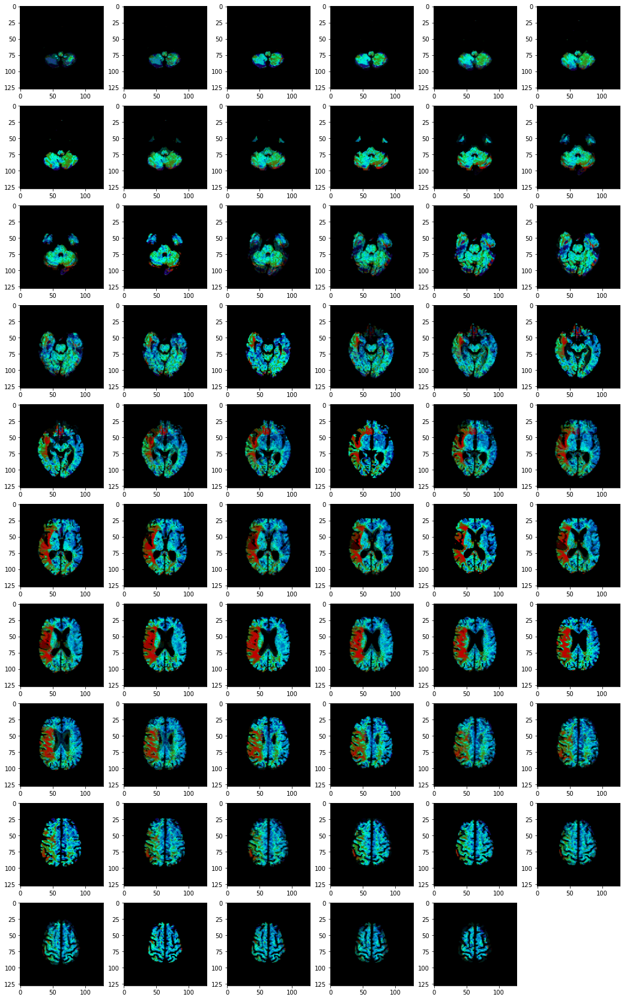

In [22]:
plot_slices(X_ttp[0], dat.loc[0,:], "axial")

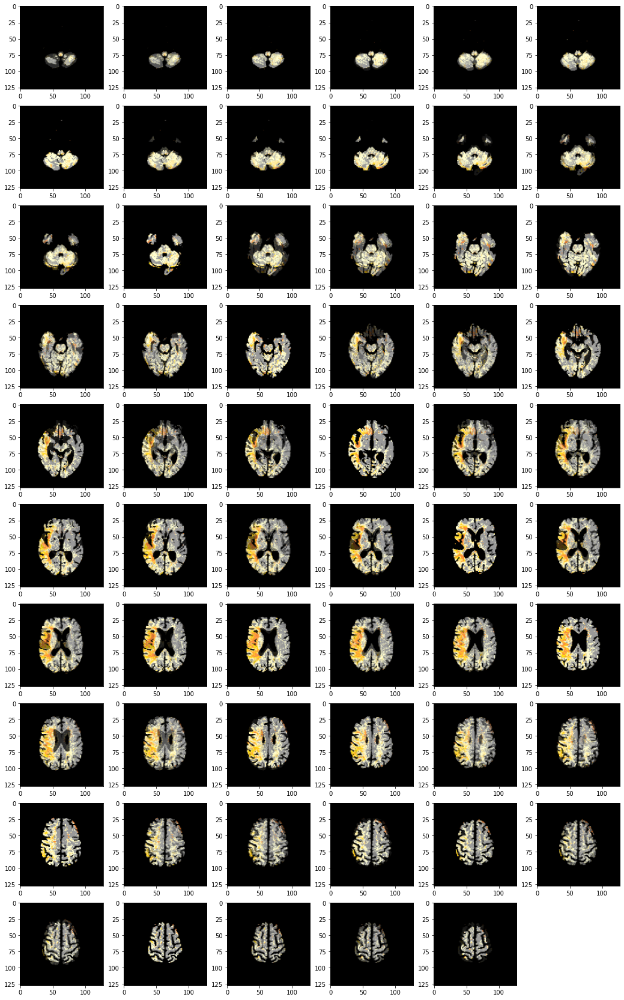

In [23]:
plot_slices(X_tmax[0], dat.loc[0,:], "axial")

In [24]:
#k = 1
#X_pat = X_dwi[k,:,:,:,0]
#Y_img_pat = Y[k]
#print(X_pat.shape, Y_img_pat.shape)
#
#fig = plt.figure(figsize = (20, 20)) # total figure size (including all subplots)
#columns = 6
#rows = 5
#fig_all = []
#for i in range(1, columns*rows):
#    img = X_pat[:,:,i]
#    fig_all.append(fig.add_subplot(rows, columns, i))
#    fig_all[-1].set_title(Y_img_pat[1])
#    plt.hist(img, range = [0, 255])
#plt.show()

### Resample to 1x1x1mm per voxel

In [25]:
# all(dat.pixel_spacing_x == dat.pixel_spacing_y)

In [26]:
# def resample(image, slicethickness, pixelspacing, new_spacing = [1,1,1]):
#     # Determine current pixel spacing
#     spacing = np.array((slicethickness, slicethickness, pixelspacing))
# 
#     resize_factor = spacing / new_spacing
#     new_real_shape = image.shape * resize_factor
#     new_shape = np.round(new_real_shape)
#     real_resize_factor = new_shape / image.shape
#     new_spacing = spacing / real_resize_factor
#     
#     image = ndimage.interpolation.zoom(image, real_resize_factor)
#     
#     return image, new_spacing
# 
# i = 0
# img = X[0,:,:,:,0]
# print("Shape before resampling: ", img.shape)
# img_resamp, spacing = resample(img, dat.iloc[i].pixel_spacing_x, dat.iloc[i].pixel_spacing_x, [1,1,1])
# print("Shape after resampling: ", img_resamp.shape)

In [27]:
# plot_slices(img_resamp.reshape((153,153,77,1)), dat.loc[0,:], "axial", modality = "DWI")

# Preprocessing
Images have different pixel intensities even within one patient, i.e. the same pixel intensities do not have the same meaning in terms of representing the same tissue/stroke

### Remove artefacts

In [28]:
# # remove the first and last two images of the patient
# # Sometimes the images on the botton/top look confusing and the strokes are not only on them!
# print(X_dwi.shape, X_adc.shape, X_cbv.shape, X_cbf.shape, X_mtt.shape, X_ttp.shape, X_tmax.shape)
# X_dwi = X_dwi[:,:,:,2:62,:]
# X_adc = X_adc[:,:,:,2:62,:]
# X_cbv = X_cbv[:,:,:,2:62,:]
# X_cbf = X_cbf[:,:,:,2:62,:]
# X_mtt = X_mtt[:,:,:,2:62,:]
# X_ttp = X_ttp[:,:,:,2:62,:]
# X_tmax = X_tmax[:,:,:,2:62,:]
# print(X_dwi.shape, X_adc.shape, X_cbv.shape, X_cbf.shape, X_mtt.shape, X_ttp.shape, X_tmax.shape)

In [29]:
# # Consider two images with different intesnities: appearance is different but histograms match now!
# print(X.shape)
# img11 = X[0,:,:,9]
# img12 = X[0,:,:,10]
# 
# fig, axs = plt.subplots(2, 2)
# axs[0,0].imshow(img11, cmap = "gray")
# axs[0,1].imshow(img12, cmap = "gray")
# _ = axs[1,0].hist(img11.flatten(), range=[0,600])
# _ = axs[1,1].hist(img12.flatten(), range=[0,600])

### Normalization: DWI and ADC

In [30]:
# normalize intensities to have pixel values between 0 and 255
def normalize(img):
    lmin = float(img.min())
    lmax = float(img.max())
    return np.floor((img - lmin)/(lmax - lmin)*255)

In [31]:
# checked also for the perfusion maps, already done!
X_dwi_norm = np.empty_like(X_dwi)
X_adc_norm = np.empty_like(X_adc)
for i in range(X_dwi.shape[0]):
    X_dwi_norm[i] = normalize(X_dwi[i])
    X_adc_norm[i] = normalize(X_adc[i])

In [32]:
print(X_dwi_norm.shape, X_dwi_norm.min(), X_dwi_norm.max())
print(X_adc_norm.shape, X_adc_norm.min(), X_adc_norm.max())

(222, 128, 128, 64, 1) 0 255
(222, 128, 128, 64, 1) 0 255


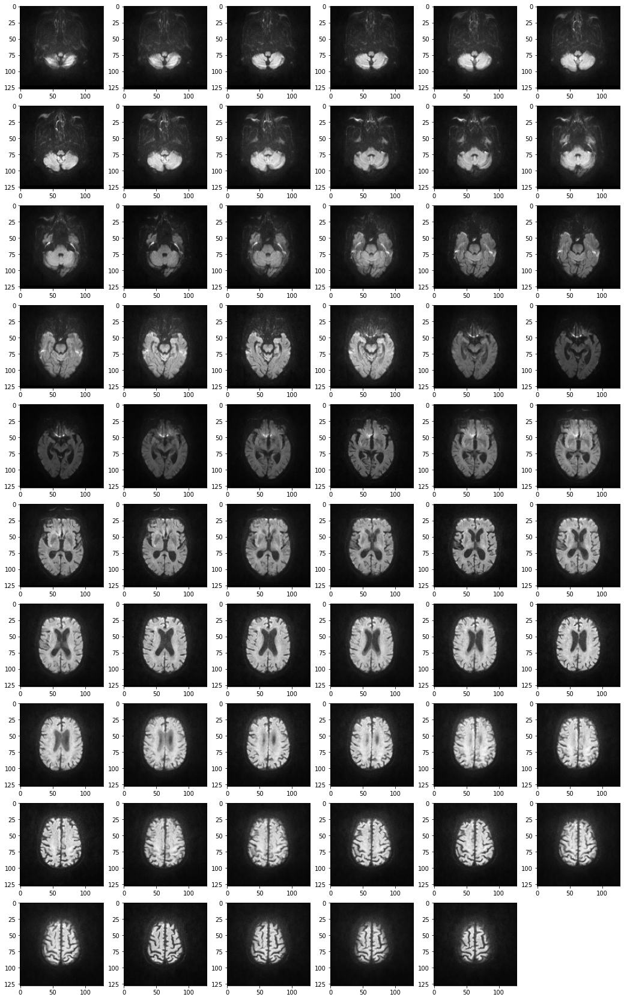

In [33]:
plot_slices(X_dwi[0], dat.loc[0,:], "axial", modality = "DWI")

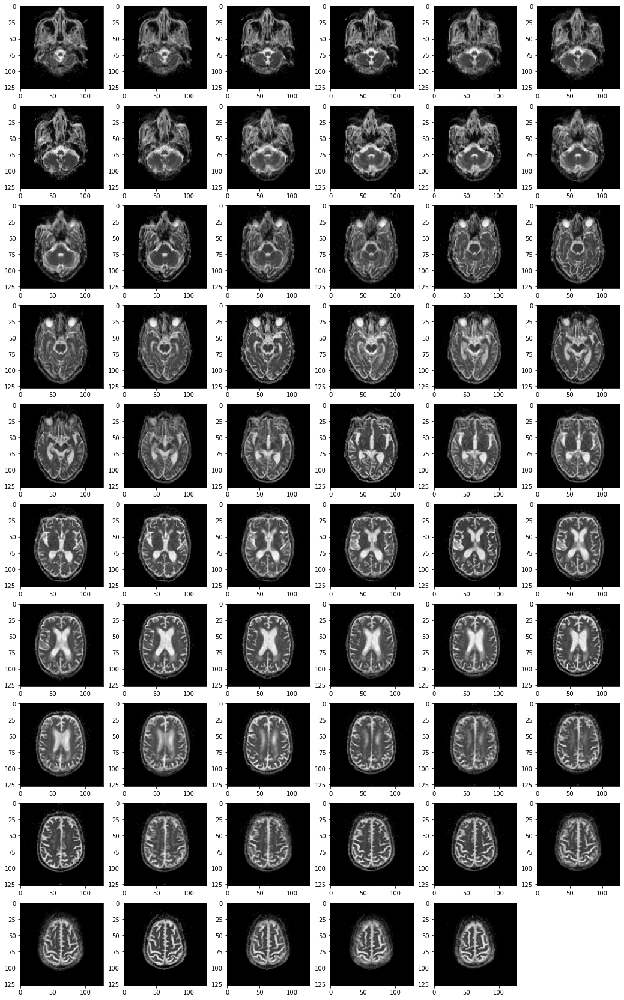

In [34]:
plot_slices(X_adc[0], dat.loc[0,:], "axial", modality = "DWI")

(222, 128, 128, 64, 1)


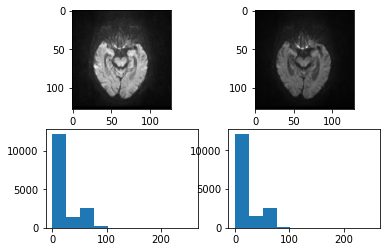

In [35]:
# Consider two images with different intensities: nur Darstellungsproblem, Verteilung sieht gut aus
print(X_dwi_norm.shape)
img11 = X_dwi_norm[0,:,:,22,0]
img12 = X_dwi_norm[0,:,:,23,0]

fig, axs = plt.subplots(2, 2)
axs[0,0].imshow(img11, cmap = "gray")
axs[0,1].imshow(img12, cmap = "gray")
_ = axs[1,0].hist(img11.flatten(), range=[0,255])
_ = axs[1,1].hist(img12.flatten(), range=[0,255])

### Intensity normalization

#### 1. Z-score normalization based on brain mask (per patient)
https://github.com/deepmedic/deepmedic/issues/72

#### DWI + ADC

Value of mask:  (array([  0, 255], dtype=uint8), array([15873,   511]))


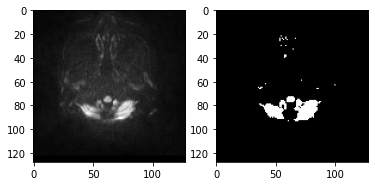

In [36]:
X_pat = X_dwi_norm[0,:,:,:,0]
j = 0
i = sitk.GetImageFromArray(X_pat[:,:,j], isVector = False)
m = sitk.OtsuThreshold(i, 0, 255, 200)
image = sitk.GetArrayViewFromImage(i)[:,:]
mask = sitk.GetArrayViewFromImage(m)[:,:]
print("Value of mask: ", np.unique(mask, return_counts=True))
fig, axs = plt.subplots(1, 2)
axs[0].imshow(image, cmap = "gray")
axs[1].imshow(mask, cmap = "gray")

72.58386411889596 19.596808384760255


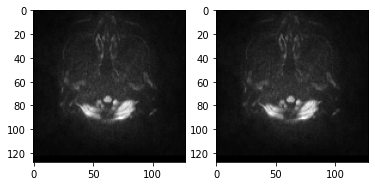

In [37]:
# mask is represented by white pixels
mask_idx = np.where(mask == 255)
image_mask = image[mask_idx]
# exclude low and high intensity pixel values for mean and std calculation
image_maskp = image_mask[(image_mask >= np.percentile(image_mask, 5)) & 
                         (image_mask <= np.percentile(image_mask, 95))]
# get mean and std
image_mask_mean = image_maskp.mean()
image_mask_std = image_maskp.std()
print(image_mask_mean, image_mask_std)
image_new = (image - image_mask_mean)/image_mask_std
fig, axs = plt.subplots(1, 2)
axs[0].imshow(image, cmap = "gray")
axs[1].imshow(image_new, cmap = "gray")

In [38]:
# # z score based on brain mask: per image
# def z_score_normalization(X, xmin, xmax):
#     # X: [xdim, ydim, zdim]
#     # xmin, xmax: pixel intensities
#     X_norm = np.empty((X.shape[0], X.shape[1], X.shape[2]))
#     for j in range(X_norm.shape[2]):
#         i = sitk.GetImageFromArray(X[:,:,j], isVector = False)
#         m = sitk.OtsuThreshold(i, xmin, xmax, 200)
#         image = sitk.GetArrayViewFromImage(i)[:,:]
#         mask = sitk.GetArrayViewFromImage(m)[:,:]
#         # mask is represented by white pixels
#         mask_idx = np.where(mask == mask.max())
#         if(np.percentile(image, 98) == 0): # in case of black images
#             # print("black image: ", j)
#             image_new = image
#         else:
#             image_mask = image[mask_idx]
#             # exclude low and high intensity values
#             image_maskp = image_mask[(image_mask >= np.percentile(image_mask, 5)) & 
#                                      (image_mask <= np.percentile(image_mask, 95))]
#             # get mean and std
#             image_mask_mean = image_maskp.mean()
#             image_mask_std = image_maskp.std()
#             image_new = (image - image_mask_mean) / image_mask_std
#             if(image_mask_std == 0):
#                 print("std 0 in image: ", j)
#             #print(image_mask_mean, image_mask_std)
#         X_norm[:,:,j] = image_new
#     return X_norm

In [39]:
# z score based on brain mask: per patient
def z_score_normalization(X, xmin, xmax):
    # X: [xdim, ydim, zdim]
    # xmin, xmax: pixel intensities
    X_norm = np.empty((X.shape[0], X.shape[1], X.shape[2]))
    patient_maskp = []
    for j in range(X_norm.shape[2]):
        i = sitk.GetImageFromArray(X[:,:,j], isVector = False)
        m = sitk.OtsuThreshold(i, xmin, xmax, 200)
        image = sitk.GetArrayViewFromImage(i)[:,:]
        mask = sitk.GetArrayViewFromImage(m)[:,:]
        # mask is represented by white pixels
        mask_idx = np.where(mask == mask.max())
        if(np.percentile(image, 98) != 0): # consider only non-black images
            image_mask = image[mask_idx]
            # exclude low and high intensity values
            image_maskp = image_mask[(image_mask >= np.percentile(image_mask, 5)) & 
                                     (image_mask <= np.percentile(image_mask, 95))]
            patient_maskp.append(image_maskp)
    # get mean and std
    patient_maskp = np.concatenate(patient_maskp)
    patient_maskp_mean = patient_maskp.mean()
    patient_maskp_std = patient_maskp.std()
    #if(image_mask_std == 0):
    #    print("std 0 in image: ", j)
    #print(mask_mean, mask_std)
    for j in range(X_norm.shape[2]):
        X_norm[:,:,j] = (X[:,:,j] - patient_maskp_mean) / patient_maskp_std
    return X_norm

In [40]:
# # DWI and ADC
# j = 0
# X_pat = X_dwi_norm[j,:,:,:,0]
# X_pat_norm = z_score_normalization(X_pat, 0, 255)
# print(X_pat_norm.shape, X_pat_norm.min(), X_pat_norm.max())
# plot_slices(X_pat_norm.reshape((128,128,64,1)), dat.loc[0,:], "axial", modality = "DWI")

In [41]:
# normalize for all patients: DWI
print(X_dwi_norm.min(), X_dwi_norm.max())
X_dwi_normz = np.empty((X_dwi_norm.shape[0], X_dwi_norm.shape[1], X_dwi_norm.shape[2], X_dwi_norm.shape[3]))
for i in range(X_dwi_norm.shape[0]):
    X_dwi_normz[i] = z_score_normalization(X_dwi_norm[i,:,:,:,0], 0, 255)
print(X_dwi_normz.min(), X_dwi_normz.max())

0 255
-7.217837989522173 39.758812613731685


In [42]:
# normalize for all patients: ADC
print(X_adc_norm.min(), X_adc_norm.max())
X_adc_normz = np.empty((X_adc_norm.shape[0], X_adc_norm.shape[1], X_adc_norm.shape[2], X_adc_norm.shape[3]))
for i in range(X_adc_norm.shape[0]):
    X_adc_normz[i] = z_score_normalization(X_adc_norm[i,:,:,:,0], 0, 255)
print(X_adc_normz.min(), X_adc_normz.max())

0 255
-3.6252337663444734 11.162901310149785


In [43]:
# reshape for CNN input
X_dwi_normz = X_dwi_normz.reshape((X_dwi_normz.shape[0], X_dwi_normz.shape[1], X_dwi_normz.shape[2], 
                                   X_dwi_normz.shape[3], 1))

In [44]:
X_adc_normz = X_adc_normz.reshape((X_adc_normz.shape[0], X_adc_normz.shape[1], X_adc_normz.shape[2], 
                                   X_adc_normz.shape[3], 1))

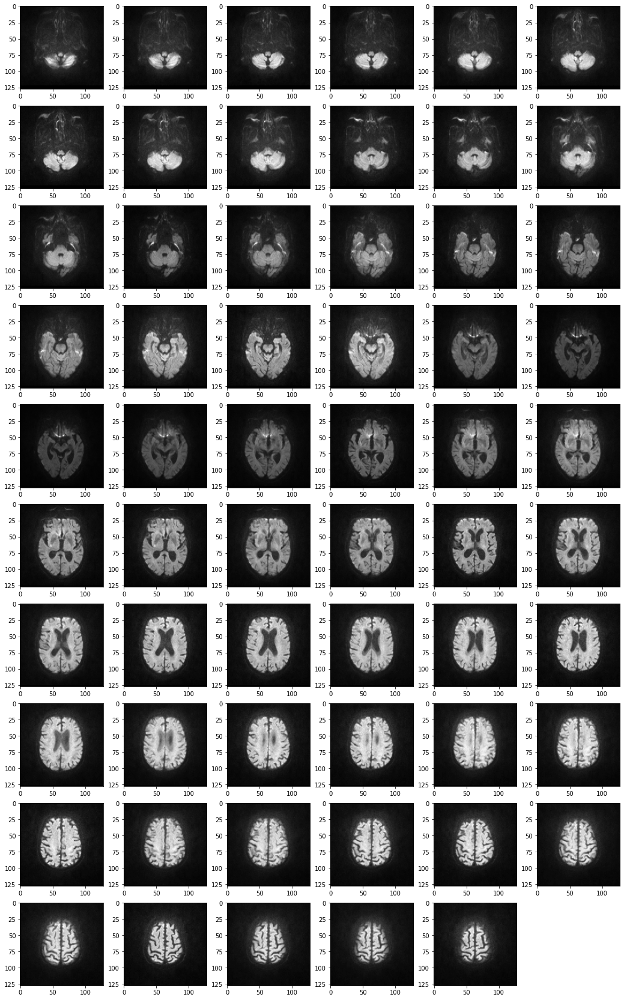

In [45]:
plot_slices(X_dwi_normz[0], dat.loc[0,:], "axial", modality = "DWI")

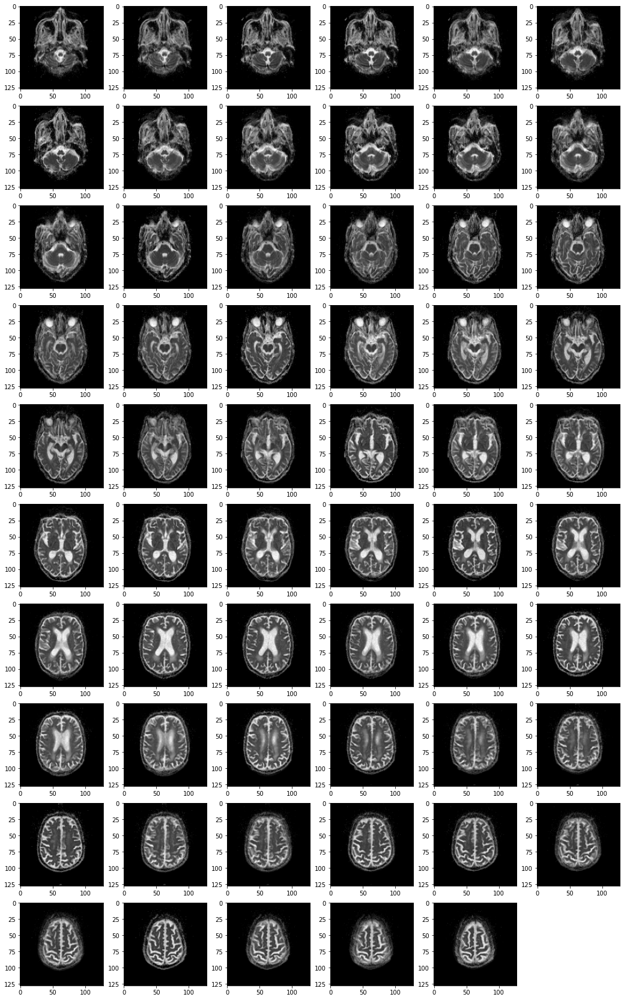

In [46]:
plot_slices(X_adc_normz[0], dat.loc[0,:], "axial", modality = "DWI")

(222, 128, 128, 64, 1)


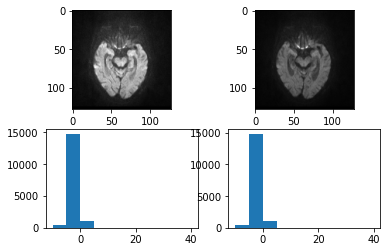

In [47]:
# Consider two images with different intensities: nur Darstellungsproblem, Verteilung sieht gut aus
print(X_dwi_normz.shape)
img11 = X_dwi_normz[0,:,:,22,0]
img12 = X_dwi_normz[0,:,:,23,0]

fig, axs = plt.subplots(2, 2)
axs[0,0].imshow(img11, cmap = "gray")
axs[0,1].imshow(img12, cmap = "gray")
_ = axs[1,0].hist(img11.flatten(), range=[-10,40])
_ = axs[1,1].hist(img12.flatten(), range=[-10,40])

#### Color images: CBV, CBF, MTT, TTP, TMAX

In [48]:
## color images
#X_pat = X_cbv[6,:,:,:,:]
#j = 50
#i = sitk.GetImageFromArray(X_pat[:,:,j,:], isVector = False)
#m = sitk.OtsuThreshold(i, 0, 255, 200)
#image = sitk.GetArrayViewFromImage(i)[:,:,:]
#mask = sitk.GetArrayViewFromImage(m)[:,:,:]
#print("Value of mask: ", np.unique(mask, return_counts=True))
#fig, axs = plt.subplots(1, 2)
#axs[0].imshow(image)#, cmap = "gray")
#axs[1].imshow(mask)#, cmap = "gray")

In [49]:
## mask is represented by white pixels also in case of the colour images
#mask_idx = np.where(mask == 255)
#if(mask_idx[0].size == 0): # in case of black images
#    # exclude low and high intensity pixel values for mean and std calculation
#    image_new = image
#else:
#    image_mask = image[mask_idx]
#    # exclude low and high intensity pixel values for mean and std calculation
#    image_maskp = image_mask[(image_mask >= np.percentile(image_mask, 5)) & 
#                             (image_mask <= np.percentile(image_mask, 95))]
#    # get mean and std
#    image_mask_mean = image_maskp.mean()
#    image_mask_std = image_maskp.std()
#    print(image_mask_mean, image_mask_std)
#    image_new = (image - image_mask_mean)/image_mask_std
#fig, axs = plt.subplots(1, 2)
#axs[0].imshow(image)#, cmap = "gray")
#axs[1].imshow(image_new)#, cmap = "gray")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

(222, 128, 128, 64, 3) -4.333024866818797 3.2331711640361047


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

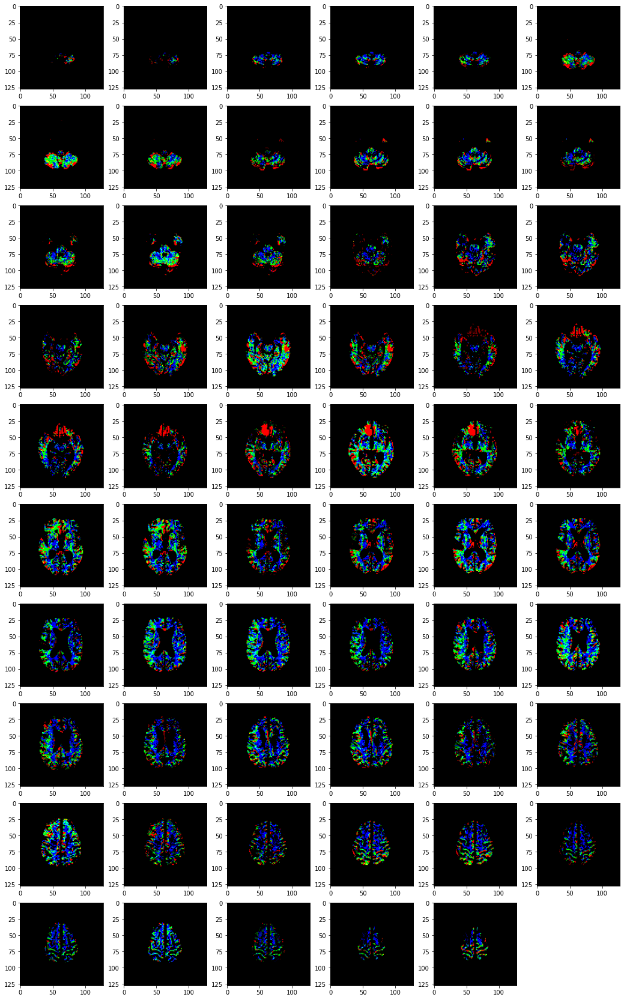

In [50]:
# normalize for all patients per color chanel: CBV
X_cbv_normz = np.empty((X_cbv.shape[0], X_cbv.shape[1], X_cbv.shape[2], X_cbv.shape[3], X_cbv.shape[4]))
for i in range(X_cbv.shape[0]):
    for k in range(3):
        X_cbv_normz[i,:,:,:,k] = z_score_normalization(X_cbv[i,:,:,:,k], 0, 255)
print(X_cbv_normz.shape, X_cbv_normz.min(), X_cbv_normz.max())
plot_slices(X_cbv_normz[0], dat.loc[0,:], "axial")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(222, 128, 128, 64, 3) -4.8402287098349355 2.6701261671385956


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

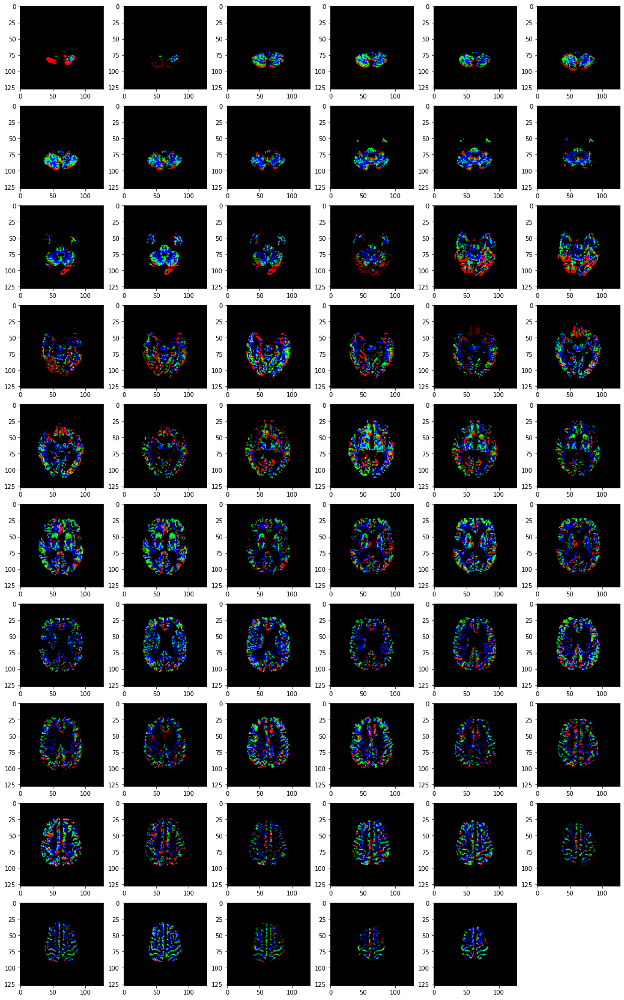

In [51]:
# normalize for all patients per color chanel: cbf
X_cbf_normz = np.empty((X_cbf.shape[0], X_cbf.shape[1], X_cbf.shape[2], X_cbf.shape[3], X_cbf.shape[4]))
for i in range(X_cbf.shape[0]):
    for k in range(3):
        X_cbf_normz[i,:,:,:,k] = z_score_normalization(X_cbf[i,:,:,:,k], 0, 255)
print(X_cbf_normz.shape, X_cbf_normz.min(), X_cbf_normz.max())
plot_slices(X_cbf_normz[0], dat.loc[0,:], "axial")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

(222, 128, 128, 64, 3) -5.030771499699376 6.749527888842101


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

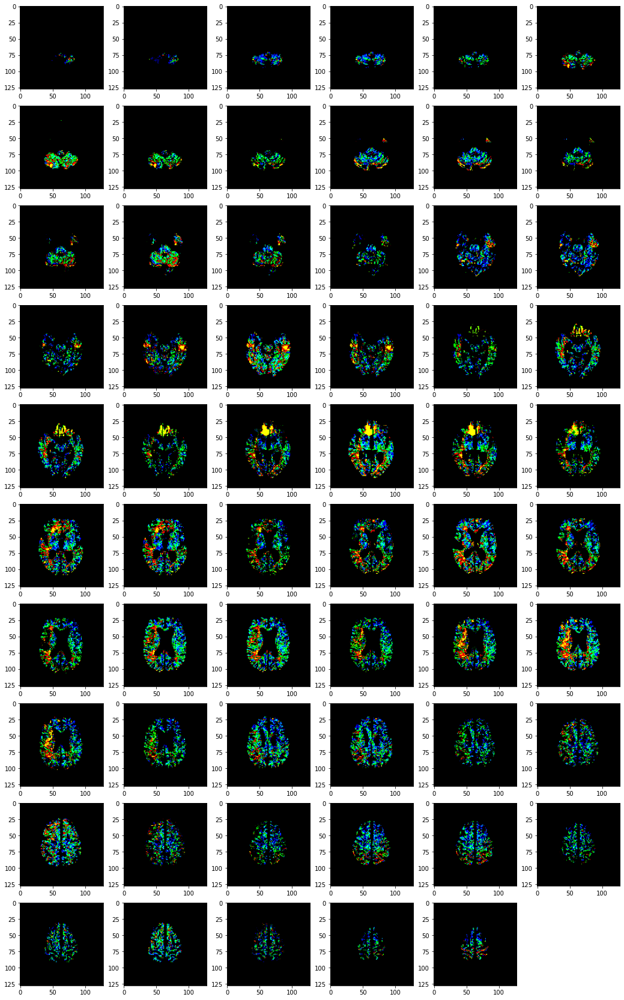

In [52]:
# normalize for all patients per color chanel: mtt
X_mtt_normz = np.empty((X_mtt.shape[0], X_mtt.shape[1], X_mtt.shape[2], X_mtt.shape[3], X_mtt.shape[4]))
for i in range(X_mtt.shape[0]):
    for k in range(3):
        X_mtt_normz[i,:,:,:,k] = z_score_normalization(X_mtt[i,:,:,:,k], 0, 255)
print(X_mtt_normz.shape, X_mtt_normz.min(), X_mtt_normz.max())
plot_slices(X_mtt_normz[0], dat.loc[0,:], "axial")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(222, 128, 128, 64, 3) -8.393964377965972 6.957961440652617


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

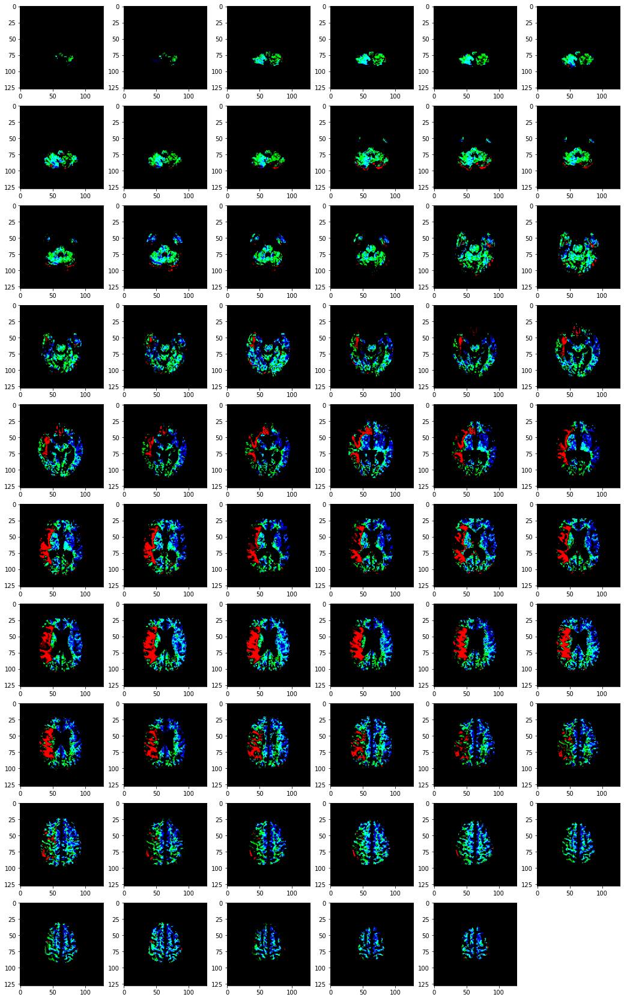

In [53]:
# normalize for all patients per color chanel: ttp
X_ttp_normz = np.empty((X_ttp.shape[0], X_ttp.shape[1], X_ttp.shape[2], X_ttp.shape[3], X_ttp.shape[4]))
for i in range(X_ttp.shape[0]):
    for k in range(3):
        X_ttp_normz[i,:,:,:,k] = z_score_normalization(X_ttp[i,:,:,:,k], 0, 255)
print(X_ttp_normz.shape, X_ttp_normz.min(), X_ttp_normz.max())
plot_slices(X_ttp_normz[0], dat.loc[0,:], "axial")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

(222, 128, 128, 64, 3) -8.517446949444599 6.353164602395974


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

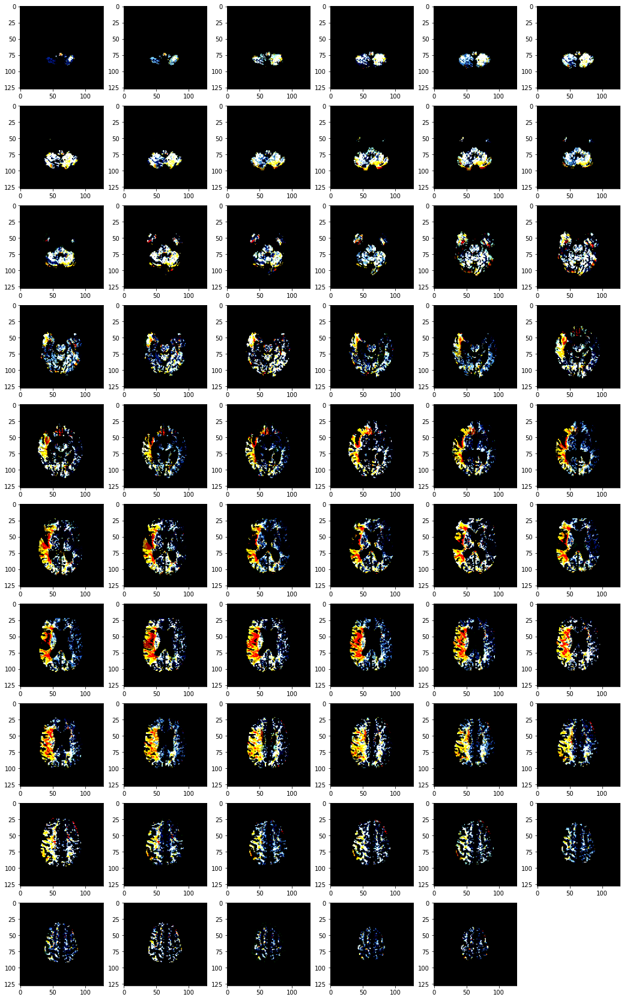

In [54]:
# normalize for all patients per color chanel: tmax
X_tmax_normz = np.empty((X_tmax.shape[0], X_tmax.shape[1], X_tmax.shape[2], X_tmax.shape[3], X_tmax.shape[4]))
for i in range(X_tmax.shape[0]):
    for k in range(3):
        X_tmax_normz[i,:,:,:,k] = z_score_normalization(X_tmax[i,:,:,:,k], 0, 255)
print(X_tmax_normz.shape, X_tmax_normz.min(), X_tmax_normz.max())
plot_slices(X_tmax_normz[0], dat.loc[0,:], "axial")

In [55]:
# save the preprocessed data
with h5py.File(DIR + 'hezo/stroke_perfusion/data/data_bern_25_11_2020_preprocessed.h5', "w") as h5:
    h5.create_dataset("X_dwi", data = X_dwi_normz)
    h5.create_dataset("X_adc", data = X_adc_normz)
    h5.create_dataset("X_cbv", data = X_cbv_normz)
    h5.create_dataset("X_cbf", data = X_cbf_normz)
    h5.create_dataset("X_mtt", data = X_mtt_normz)
    h5.create_dataset("X_ttp", data = X_ttp_normz)
    h5.create_dataset("X_tmax", data = X_tmax_normz)

In [55]:
## normalize intensities to have pixel values between 0 and 1
#def normalize(img):
#    lmin = float(img.min())
#    lmax = float(img.max())
#    return np.floor((img - lmin)/(lmax - lmin))

In [ ]:
# # checked also for the perfusion maps, already done!
# X_dwi_normzz = np.empty_like(X_dwi_normz)
# X_adc_normzz = np.empty_like(X_adc_normz)
# X_cbv_normzz = np.empty_like(X_cbv_normz)
# X_cbf_normzz = np.empty_like(X_cbf_normz)
# X_mtt_normzz = np.empty_like(X_mtt_normz)
# X_ttp_normzz = np.empty_like(X_ttp_normz)
# X_tmax_normzz = np.empty_like(X_tmax_normz)
# for i in range(X_dwi.shape[0]):
#     X_dwi_normzz[i] = normalize(X_dwi_normz[i])
#     X_adc_normzz[i] = normalize(X_adc_normz[i])
#     X_cbv_normzz[i] = normalize(X_cbv_normz[i])
#     X_cbf_normzz[i] = normalize(X_cbf_normz[i])
#     X_mtt_normzz[i] = normalize(X_mtt_normz[i])
#     X_ttp_normzz[i] = normalize(X_ttp_normz[i])
#     X_tmax_normzz[i] = normalize(X_tmax_normz[i])

In [ ]:
#plot_slices(X_adc_normzz[0], dat.loc[0,:], "axial")

In [ ]:
#plot_slices(X_dwi_normzz[0], dat.loc[0,:], "axial")

In [ ]:
#plot_slices(X_tmax_normz[0], dat.loc[0,:], "axial")